In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# helper functions

In [2]:
def load_data(donors):
    '''
    Loads (normalized by machine standard) raw data from a list of donors.
    Returns DataFrames in a dictionary.
    '''
    
    data = {}
    for donor in donors:
        data[donor] = pd.read_csv(f'raw_data/{donor}.csv')
    
    return data

def get_fitted_concentration_data(data,donor,sv2):
    
    x_values = data[donor]['time'].copy()
    y_values = np.array(data[donor].loc[:,['Caffeine','Paraxanthine','Theobromine','Theophylline']].copy())
    y_values = y_values.flatten()
    
    calibration_k = np.array([np.ones(len(x_values))*1.520,np.ones(len(x_values))*1.656,np.ones(len(x_values))*2.050,np.ones(len(x_values))*1.592]).flatten('F')
    y_values = y_values*calibration_k

    vsample = 123/1000        # sample volume over 1000 to get to the correct units
    factor  = vsample
    y_values = y_values*factor/np.array([sv2,sv2,sv2,sv2]).flatten('F')
    
    return x_values.astype('float64'), y_values.astype('float64')

def fitting_data_no_imputation(data,donor):
    '''
    Takes raw data dictionary and donor name.
    Parses x_values and y_values.
    Transforms y_values by calibration curve.
    Assigns 10**8 sigma values (= weights) to all 0s because they are below LOQ and thus regarded as NaNs.
    Returns x_values, sigma, y_values as float64 np.arrays.
    '''
    
    x_values = data[donor]['time'].copy()
    y_values = np.array(data[donor].loc[:,['Caffeine','Paraxanthine','Theobromine','Theophylline']].copy())
    y_values = y_values.flatten()
    
    # apply calibration curve
    calibration_k = np.array([np.ones(len(x_values))*1.520,np.ones(len(x_values))*1.656,np.ones(len(x_values))*2.050,np.ones(len(x_values))*1.592]).flatten('F')
    y_values      = y_values*calibration_k

    # pharmacological factors
    vdist_avail = 0.579                                        # volume of distribution/ bioavailability of caffeine
    vsample     = 123                                          # sample volume in µL
    dose        = 200*10**3                                    # caffeine dose in µg
    body_mass   = {'Donor_16': 72, 'Donor_6': 83, 'Donor_19': 83, 'Donor_17': 52, 'Donor_18': 66, 'Donor_7': 66, 'Donor_3': 57, 'Donor_4': 84, 'Donor_5': 82.5, 'Donor_2': 77, 'Donor_8': 80, 'Donor_9': 83, 'Donor_10': 55, 'Donor_11': 54, 'Donor_1': 70, 'Donor_20': 105, 'Donor_21': 70, 'Donor_22': 64, 'Donor_23': 57, 'Donor_24': 60, 'Donor_25': 80, 'Donor_26': 86, 'Donor_27': 68, 'Donor_28': 82, 'Donor_29': 60, 'Donor_30': 55, 'Donor_31': 80, 'Donor_32': 92, 'Donor_33': 92, 'Donor_34': 71, 'Donor_35': 80, 'Donor_36': 77, 'Donor_37': 66, 'Donor_38': 63, 'Donor_39': 75, 'Donor_40': 75, 'Donor_41': 57, 'Donor_42': 75, 'Donor_43': 99, 'Donor_44': 75, 'Donor_45': 61, 'Donor_46': 52, 'Donor_47': 80}
    factor      = vsample*body_mass[donor]*vdist_avail/dose
    y_values    = y_values*factor
    
    # creating weights (= sigma)
    y_values_no_nan = np.nan_to_num(y_values,nan=0) 
    sigma = []
    for i in np.isnan(y_values):
        if i:
            sigma.append(10**8)
        else:
            sigma.append(1)

    return x_values.astype('float64'), y_values_no_nan.astype('float64'), np.array(sigma).astype('float64')

def caf(tt,k1,k2,k3,k4,k5,k6,k7,k8,par0,bro0,phy0):
    '''Takes timepoints and kinetic parameters, calculates concentration time series of caffeine.'''
    k9 = k2+k3+k4+k5
    y = k1/(k9-k1)*(np.exp(-k1*tt)-np.exp(-k9*tt))
    return y

def par(tt,k1,k2,k3,k4,k5,k6,k7,k8,par0,bro0,phy0):
    '''Takes timepoints and kinetic parameters, calculates concentration time series of paraxanthine.'''
    k9 = k2+k3+k4+k5
    y = k1*k2/(k9-k1)*(np.exp(-k9*tt)/(k9-k6)-np.exp(-k1*tt)/(k1-k6)+np.exp(-k6*tt)*(k9-k1)/((k9-k6)*(k1-k6)))+par0*np.exp(-k6*tt)
    return y

def bro(tt,k1,k2,k3,k4,k5,k6,k7,k8,par0,bro0,phy0):
    '''Takes timepoints and kinetic parameters, calculates concentration time series of theobromine.'''
    k9 = k2+k3+k4+k5
    y = k1*k3/(k9-k1)*(np.exp(-k9*tt)/(k9-k7)-np.exp(-k1*tt)/(k1-k7)+np.exp(-k7*tt)*(k9-k1)/((k9-k7)*(k1-k7)))+bro0*np.exp(-k7*tt)
    return y

def phy(tt,k1,k2,k3,k4,k5,k6,k7,k8,par0,bro0,phy0):
    '''Takes timepoints and kinetic parameters, calculates concentration time series of theophylline.'''
    k9 = k2+k3+k4+k5
    y = k1*k4/(k9-k1)*(np.exp(-k9*tt)/(k9-k8)-np.exp(-k1*tt)/(k1-k8)+np.exp(-k8*tt)*(k9-k1)/((k9-k8)*(k1-k8)))+phy0*np.exp(-k8*tt)
    return y


# parse results

In [3]:
# parameter properties
parameter_names = ['k1','k2','k3','k4','k5','k6','k7','k8','cpar0','cbro0','cphy0','vsweat1','vsweat2','vsweat3','vsweat4','vsweat5','vsweat6','vsweat7','vsweat8','vsweat9','vsweat10','vsweat11','vsweat12','vsweat13','vsweat14','vsweat15','vsweat16','vsweat17','vsweat18','vsweat19','vsweat20','vsweat21','vsweat22','vsweat23','vsweat24']
parameter_units = ['[h-1]','[h-1]','[h-1]','[h-1]','[h-1]','[h-1]','[h-1]','[h-1]','[unitless]','[unitless]','[unitless]','[µL]','[µL]','[µL]','[µL]','[µL]','[µL]','[µL]','[µL]','[µL]','[µL]','[µL]','[µL]','[µL]','[µL]','[µL]','[µL]','[µL]','[µL]','[µL]','[µL]','[µL]','[µL]','[µL]','[µL]']

# load raw data for all donors
donors = ['Donor_1', 'Donor_10', 'Donor_16', 'Donor_17', 'Donor_18', 'Donor_19', 'Donor_2', 'Donor_20', 'Donor_21', 'Donor_22', 'Donor_23', 'Donor_24', 'Donor_25', 'Donor_26', 'Donor_27', 'Donor_28', 'Donor_29', 'Donor_3', 'Donor_30', 'Donor_31', 'Donor_32', 'Donor_33', 'Donor_34', 'Donor_35', 'Donor_36', 'Donor_37', 'Donor_38', 'Donor_39', 'Donor_4', 'Donor_40', 'Donor_41', 'Donor_42', 'Donor_43', 'Donor_44', 'Donor_45', 'Donor_46', 'Donor_47', 'Donor_5', 'Donor_7', 'Donor_8', 'Donor_9']
data   = load_data(donors)

best_parameters = {}
for donor in donors:  
    # read in file from the output data that was used in the manuscript
    with open(f'./fitted_parameters/{donor}.txt','r') as file:
        lines  = file.readlines()
    parameters = []
    losses     = []
    for line in lines:
        tmp = []
        for l in line.split()[0:-1]:
            tmp.append(float(l))
        parameters.append(tmp)
        losses.append(float(line.split()[-1]))
    
    # select fit with lowest loss
    best = parameters[np.argmin(losses)]
    best_parameters[donor] = best
   
    # write out donor-wise results
    #print('--------',donor,'--------')
    for value, name, unit in zip(best,parameter_names,parameter_units):
            #print('{:15} {:0.3f} {:5} '.format(name,round(value,6),unit))
            pass
print('done')

done


# plot absolute concentrations

In [4]:
def plot_absolute_concentration(best,donor,data,tmp_ax1,tmp_ax3):
    ax1 = tmp_ax1
    ax3 = tmp_ax3

    ## define parameters
    args = best[:11]                       # the first 11 parsed parameters are the kinetic constants + c0s
    sv = np.array(best[11:])               # the later parsed parameters are sweat volumes
    sv2 = np.array([sv,sv]).flatten('F')   # there are always 2 measurements per timepoint, therefore we need 2*sv
    x_values, y_values = get_fitted_concentration_data(data,donor,sv2)
    
    # pharmacological factors
    vdist_avail = 0.579                                        # volume of distribution/ bioavailability of caffeine
    dose        = 200*10**3                                    # caffeine dose in µg
    body_mass   = {'Donor_16': 72, 'Donor_6': 83, 'Donor_19': 83, 'Donor_17': 52, 'Donor_18': 66, 'Donor_7': 66, 'Donor_3': 57, 'Donor_4': 84, 'Donor_5': 82.5, 'Donor_2': 77, 'Donor_8': 80, 'Donor_9': 83, 'Donor_10': 55, 'Donor_11': 54, 'Donor_1': 70, 'Donor_20': 105, 'Donor_21': 70, 'Donor_22': 64, 'Donor_23': 57, 'Donor_24': 60, 'Donor_25': 80, 'Donor_26': 86, 'Donor_27': 68, 'Donor_28': 82, 'Donor_29': 60, 'Donor_30': 55, 'Donor_31': 80, 'Donor_32': 92, 'Donor_33': 92, 'Donor_34': 71, 'Donor_35': 80, 'Donor_36': 77, 'Donor_37': 66, 'Donor_38': 63, 'Donor_39': 75, 'Donor_40': 75, 'Donor_41': 57, 'Donor_42': 75, 'Donor_43': 99, 'Donor_44': 75, 'Donor_45': 61, 'Donor_46': 52, 'Donor_47': 80}
    factor      = dose/(body_mass[donor]*vdist_avail*1000)
    
    #caf
    ax1.plot(np.linspace(0,27*60,1000),caf(np.linspace(0,27,1000),*args)*factor,'#730897')
    ax1.scatter(x_values*60,y_values[0::4],marker='.',color='#730897')
    #par
    ax1.plot(np.linspace(0,27*60,1000),par(np.linspace(0,27,1000),*args)*factor,'#fa8010')
    ax1.scatter(x_values*60,y_values[1::4],marker='.',color='#fa8010')
    #bro
    ax1.plot(np.linspace(0,27*60,1000),bro(np.linspace(0,27,1000),*args)*factor,'#50a1fc')
    ax1.scatter(x_values*60,y_values[2::4],marker='.',color='#50a1fc')
    #phy
    ax1.plot(np.linspace(0,27*60,1000),phy(np.linspace(0,27,1000),*args)*factor,'#048002')
    ax1.scatter(x_values*60,y_values[3::4],marker='.',color='#048002')

    # adjusted R2
    # R2adj = 1 - (1-R2) * (n-1)/(n-p)
    # p == number of parameters
    # n == number of samples
    _x_values, observed, _sigma = fitting_data_no_imputation(data,donor)
    expected = np.array([caf(x_values,*args)*sv2,par(x_values,*args)*sv2,bro(x_values,*args)*sv2,phy(x_values,*args)*sv2]).flatten('F')
    sstot = np.sum((observed-np.mean(observed))**2)
    ssres = np.sum((observed-expected)**2)
    r2 = 1-ssres/sstot
    p = 11+len(sv)
    n = 4*len(sv)*2
    r2_adj = 1-(1-r2)*(n-1)/(n-p)
    
    # write out R2adj
    ax1.text(1000,3,donor+'\n'+r'R$^2_{\rm adjusted} =$'+' {:5.3f}'.format(r2_adj),size=12)
    
    # plot v_sweat
    ax3.bar(x_values[0::2][:len(sv)]*60,sv,.3*60,color='gray',edgecolor='k')
    
    # make the plot nicer
    ax3.set_ylabel(r'$V_{\rm sweat}$ in µL')
    ax3.tick_params(labelbottom=False)
    ax1.set_ylabel('Concentration in µg/mL')
    ax1.set_xlabel('time in min')
    ax1.set_ylim(-.1,6.5)
    ax3.set_ylim(0,7)
    ax3.set_yticks([0,2,4,6])
    ax1.set_yticks([0,1,2,3,4,5,6])
    return

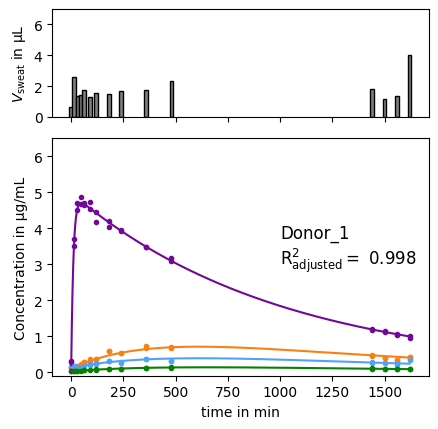

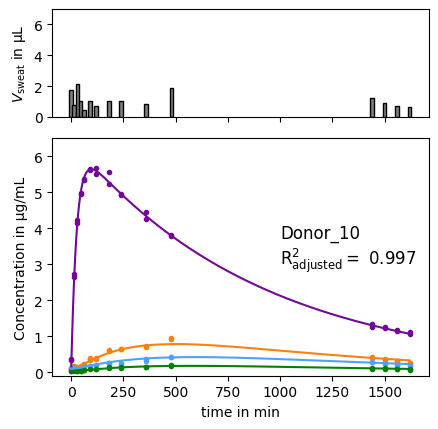

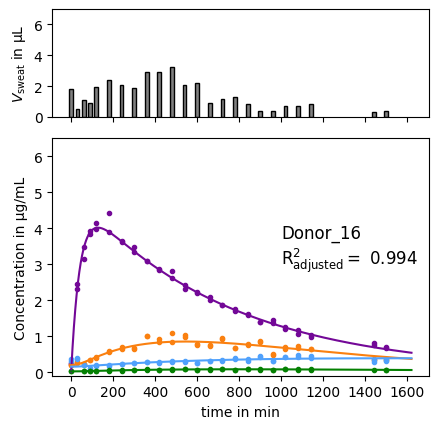

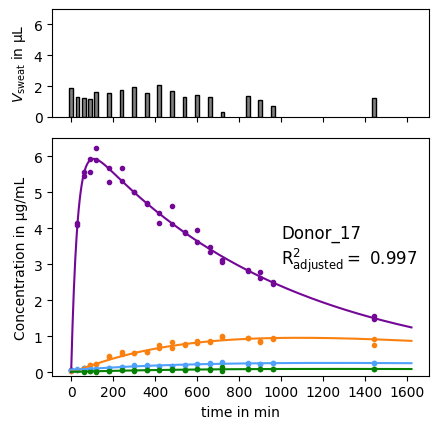

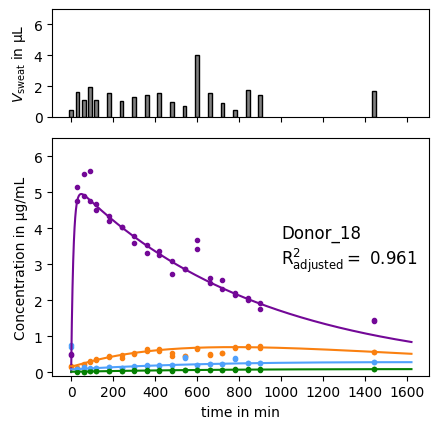

...

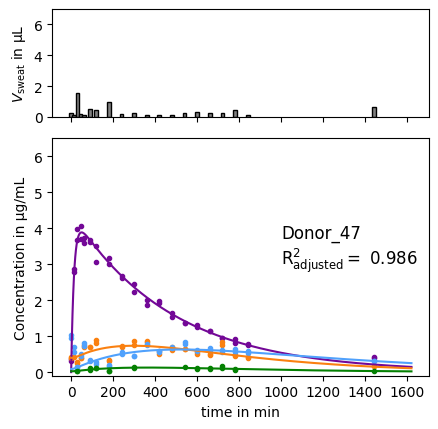

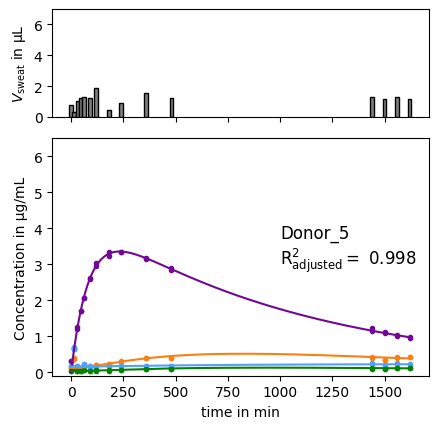

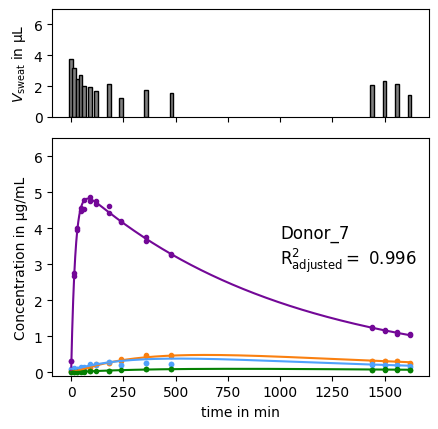

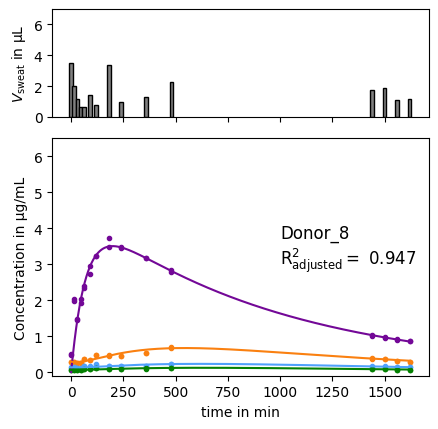

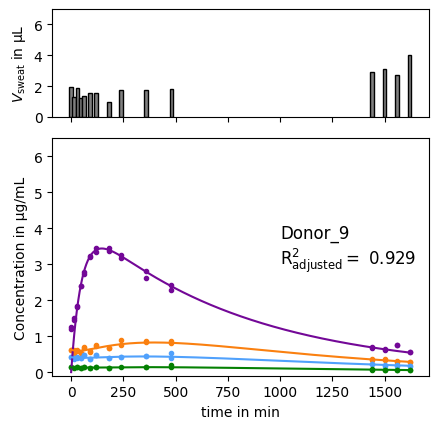

In [5]:
donors = ['Donor_1', 'Donor_10', 'Donor_16', 'Donor_17', 'Donor_18', 'Donor_19', 'Donor_2', 'Donor_20', 'Donor_21', 'Donor_22', 'Donor_23', 'Donor_24', 'Donor_25', 'Donor_26', 'Donor_27', 'Donor_28', 'Donor_29', 'Donor_3', 'Donor_30', 'Donor_31', 'Donor_32', 'Donor_33', 'Donor_34', 'Donor_35', 'Donor_36', 'Donor_37', 'Donor_38', 'Donor_39', 'Donor_4', 'Donor_40', 'Donor_41', 'Donor_42', 'Donor_43', 'Donor_44', 'Donor_45', 'Donor_46', 'Donor_47', 'Donor_5', 'Donor_7', 'Donor_8', 'Donor_9']

for donor in donors:
    fig = plt.figure(dpi=100,figsize=(10,10))
    gs = fig.add_gridspec(6, 6)
    ax1 = fig.add_subplot(gs[1:3,3:])
    ax2 = fig.add_subplot(gs[0  ,3:],sharex=ax1)
    data = load_data([donor])
    plot_absolute_concentration(best_parameters[donor],donor,data,ax1,ax2)
    plt.show()

# plot absolute concentrations with confidence intervals

In [6]:
def get_cvs_df(donor):
    
    # there are two different types of measurements: 
    # 1. earlier measurments with 15 timepoints
    # 2. later measurments with ~ 20 timepoints.
    # We load the respectively simulated CVs accordingly.
    
    if float(donor.split('_')[1]) < 14:
        cvs = pd.read_csv('../sensitivity_analysis/analysis_tables/earlier_measurements.csv')
        column_name = 'run_139'
    else:
        cvs = pd.read_csv('../sensitivity_analysis/analysis_tables/later_measurements.csv')
        column_name = 'run_134'

    cv_dic = {}
    # load CVs for the sweat volume (sv) and metabolite concentrations
    for j in ['sv','caf conc.','par conc.','bro conc.','phy conc.']:
        cv_dic[j.split()[0]] = {}
        for i in cvs.index:
            if j in cvs.loc[i,'Unnamed: 0'] and 't=' in cvs.loc[i,'Unnamed: 0']:
                cv_dic[j.split()[0]][float(cvs.loc[i,'Unnamed: 0'].strip(j+' t='))] = float(cvs.loc[i,column_name])
    cv_df = pd.DataFrame(cv_dic)

    return cv_df

In [7]:
from scipy import stats

def plot_absolute_concentration_confidence(best,donor,data,tmp_ax1,tmp_ax3):
    ax1 = tmp_ax1
    ax3 = tmp_ax3

    ## define parameters
    args = best[:11]                       # the first 11 parsed parameters are the kinetic constants + c0s
    sv = np.array(best[11:])               # the later parsed parameters are sweat volumes
    sv2 = np.array([sv,sv]).flatten('F')   # there are always 2 measurements per timepoint, therefore we need 2*sv
    x_values, y_values = get_fitted_concentration_data(data,donor,sv2)
    
    # pharmacological factors
    vdist_avail = 0.579                                        # volume of distribution/ bioavailability of caffeine
    dose        = 200*10**3                                    # caffeine dose in µg
    body_mass   = {'Donor_16': 72, 'Donor_6': 83, 'Donor_19': 83, 'Donor_17': 52, 'Donor_18': 66, 'Donor_7': 66, 'Donor_3': 57, 'Donor_4': 84, 'Donor_5': 82.5, 'Donor_2': 77, 'Donor_8': 80, 'Donor_9': 83, 'Donor_10': 55, 'Donor_11': 54, 'Donor_1': 70, 'Donor_20': 105, 'Donor_21': 70, 'Donor_22': 64, 'Donor_23': 57, 'Donor_24': 60, 'Donor_25': 80, 'Donor_26': 86, 'Donor_27': 68, 'Donor_28': 82, 'Donor_29': 60, 'Donor_30': 55, 'Donor_31': 80, 'Donor_32': 92, 'Donor_33': 92, 'Donor_34': 71, 'Donor_35': 80, 'Donor_36': 77, 'Donor_37': 66, 'Donor_38': 63, 'Donor_39': 75, 'Donor_40': 75, 'Donor_41': 57, 'Donor_42': 75, 'Donor_43': 99, 'Donor_44': 75, 'Donor_45': 61, 'Donor_46': 52, 'Donor_47': 80}
    factor      = dose/(body_mass[donor]*vdist_avail*1000)
    
    # load coefficient of variation dataframe
    cv_df = get_cvs_df(donor)
    # confidence interval/ errorbar settings
    capsize = 2
    nsigma = stats.t.ppf(1-0.025, 4*len(sv2)*2-(11+len(sv2))-1) # t-value for p=0.95 and df = n-p-1
    
    #caf
    ax1.plot(np.linspace(0,27*60,1000),caf(np.linspace(0,27,1000),*args)*factor,'#730897')
    ax1.scatter(x_values*60,y_values[0::4],marker='.',color='#730897')
    cvs = []
    for x in x_values:
        try:
            cvs.append(cv_df.loc[x,'caf']) # get correct CV
        except: 
            # in rare cases the correct timepoint was not sampled in the simulation
            # take the CV of a timepoint closest to x
            cvs.append(cv_df.loc[cv_df.index[np.argmin(abs(x-cv_df.index))],'caf'])
    conf_int = caf(x_values,*args)*factor*np.array(cvs)/100*nsigma
    ax1.errorbar(x_values*60,caf(x_values,*args)*factor,conf_int,color='#730897',fmt='none',linewidth=.5,capsize=capsize)
    
    #par
    ax1.plot(np.linspace(0,27*60,1000),par(np.linspace(0,27,1000),*args)*factor,'#fa8010')
    ax1.scatter(x_values*60,y_values[1::4],marker='.',color='#fa8010')
    cvs = []
    for x in x_values:
        try:
            cvs.append(cv_df.loc[x,'par']) # get correct CV
        except: 
            # in rare cases the correct timepoint was not sampled in the simulation
            # take the CV of a timepoint closest to x
            cvs.append(cv_df.loc[cv_df.index[np.argmin(abs(x-cv_df.index))],'par'])
    conf_int = par(x_values,*args)*factor*np.array(cvs)/100*nsigma
    ax1.errorbar(x_values*60,par(x_values,*args)*factor,conf_int,color='#fa8010',fmt='none',linewidth=.5,capsize=capsize)
    
    
    #bro
    ax1.plot(np.linspace(0,27*60,1000),bro(np.linspace(0,27,1000),*args)*factor,'#50a1fc')
    ax1.scatter(x_values*60,y_values[2::4],marker='.',color='#50a1fc')
    cvs = []
    for x in x_values:
        try:
            cvs.append(cv_df.loc[x,'bro']) # get correct CV
        except: 
            # in rare cases the correct timepoint was not sampled in the simulation
            # take the CV of a timepoint closest to x
            cvs.append(cv_df.loc[cv_df.index[np.argmin(abs(x-cv_df.index))],'bro'])
    conf_int = bro(x_values,*args)*factor*np.array(cvs)/100*nsigma
    ax1.errorbar(x_values*60,bro(x_values,*args)*factor,conf_int,color='#50a1fc',fmt='none',linewidth=.5,capsize=capsize)
    
    
    #phy
    ax1.plot(np.linspace(0,27*60,1000),phy(np.linspace(0,27,1000),*args)*factor,'#048002')
    ax1.scatter(x_values*60,y_values[3::4],marker='.',color='#048002')
    cvs = []
    for x in x_values:
        try:
            cvs.append(cv_df.loc[x,'phy']) # get correct CV
        except: 
            # in rare cases the correct timepoint was not sampled in the simulation
            # take the CV of a timepoint closest to x
            cvs.append(cv_df.loc[cv_df.index[np.argmin(abs(x-cv_df.index))],'phy'])
    conf_int = phy(x_values,*args)*factor*np.array(cvs)/100*nsigma
    ax1.errorbar(x_values*60,phy(x_values,*args)*factor,conf_int,color='#048002',fmt='none',linewidth=.5,capsize=capsize)

    # adjusted R2
    # R2adj = 1 - (1-R2) * (n-1)/(n-p)
    # p == number of parameters
    # n == number of samples
    _x_values, observed, _sigma = fitting_data_no_imputation(data,donor)
    expected = np.array([caf(x_values,*args)*sv2,par(x_values,*args)*sv2,bro(x_values,*args)*sv2,phy(x_values,*args)*sv2]).flatten('F')
    sstot = np.sum((observed-np.mean(observed))**2)
    ssres = np.sum((observed-expected)**2)
    r2 = 1-ssres/sstot
    p = 11+len(sv)
    n = 4*len(sv)*2
    r2_adj = 1-(1-r2)*(n-1)/(n-p)
    
    # write out R2adj
    ax1.text(1000,3,donor+'\n'+r'R$^2_{\rm adjusted} =$'+' {:5.3f}'.format(r2_adj),size=12)
    
    # plot v_sweat
    ax3.bar(x_values[0::2][:len(sv)]*60,sv,.3*60,color='gray',edgecolor='k')
    cvs = []
    for x in x_values[0::2][:len(sv)]: # per timepoint there are two technical replicates but only 1 sweat volume
        try:
            cvs.append(cv_df.loc[x,'sv']) # get correct CV
        except: 
            # in rare cases the correct timepoint was not sampled in the simulation
            # take the CV of a timepoint closest to x
            cvs.append(cv_df.loc[cv_df.index[np.argmin(abs(x-cv_df.index))],'sv'])
    conf_int = sv*np.array(cvs)/100*nsigma
    ax3.errorbar(x_values[0::2][:len(sv)]*60,sv,conf_int,color='k',fmt='none',linewidth=.5,capsize=capsize,zorder=0)
    
    # make the plot nicer
    ax3.set_ylabel(r'$V_{\rm sweat}$ in µL')
    ax3.tick_params(labelbottom=False)
    ax1.set_ylabel('Concentration in µg/mL')
    ax1.set_xlabel('time in min')
    ax1.set_ylim(-.1,6.5)
    ax3.set_ylim(0,7)
    ax3.set_yticks([0,2,4,6])
    ax1.set_yticks([0,1,2,3,4,5,6])
    return

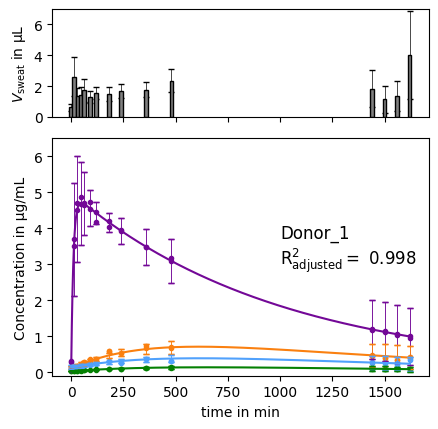

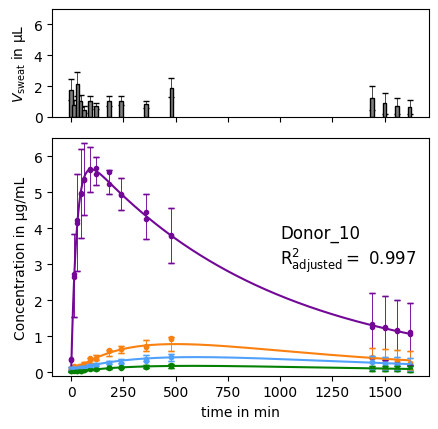

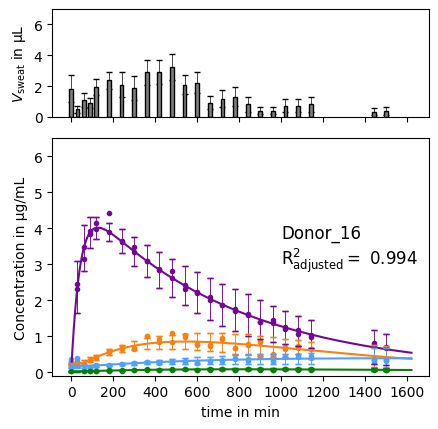

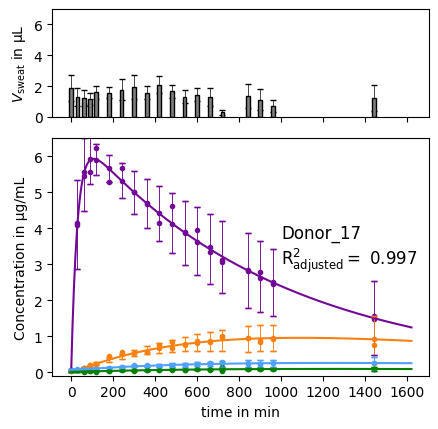

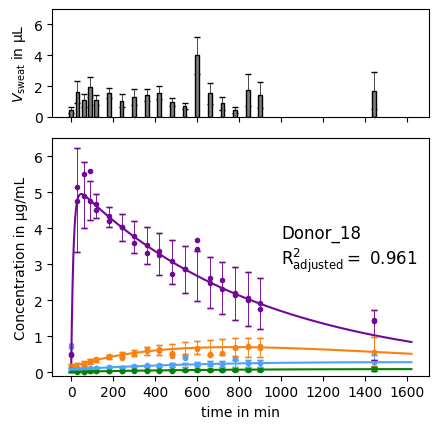

...

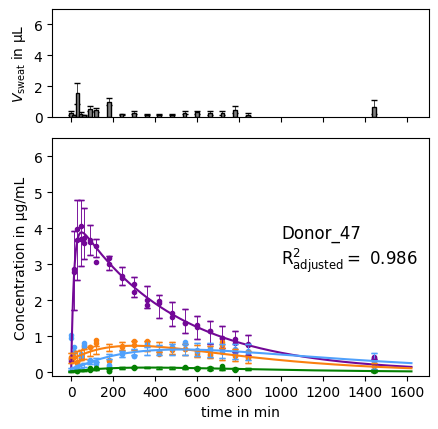

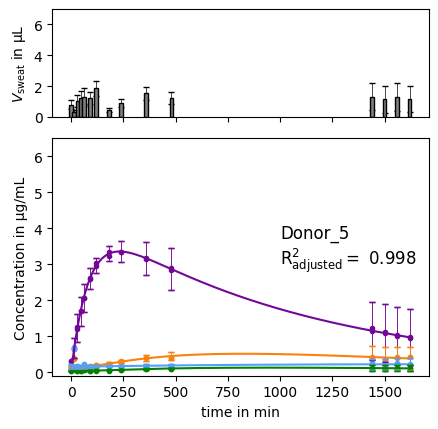

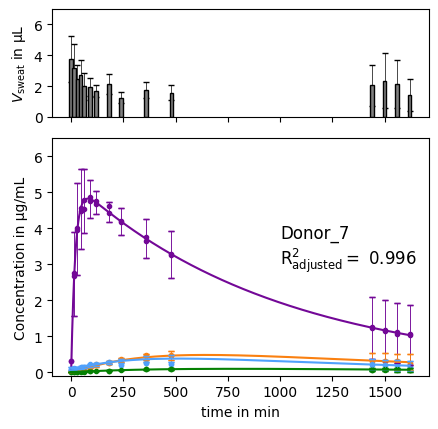

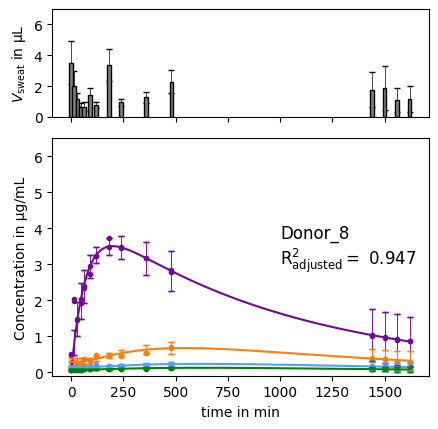

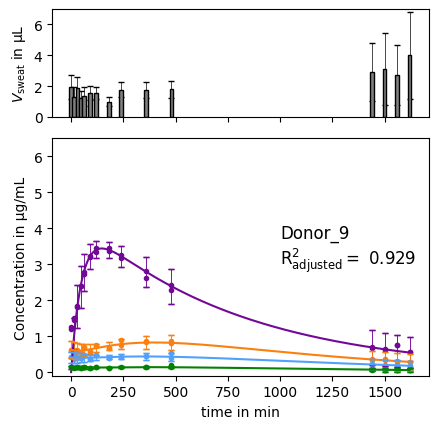

In [8]:
donors = ['Donor_1', 'Donor_10', 'Donor_16', 'Donor_17', 'Donor_18', 'Donor_19', 'Donor_2', 'Donor_20', 'Donor_21', 'Donor_22', 'Donor_23', 'Donor_24', 'Donor_25', 'Donor_26', 'Donor_27', 'Donor_28', 'Donor_29', 'Donor_3', 'Donor_30', 'Donor_31', 'Donor_32', 'Donor_33', 'Donor_34', 'Donor_35', 'Donor_36', 'Donor_37', 'Donor_38', 'Donor_39', 'Donor_4', 'Donor_40', 'Donor_41', 'Donor_42', 'Donor_43', 'Donor_44', 'Donor_45', 'Donor_46', 'Donor_47', 'Donor_5', 'Donor_7', 'Donor_8', 'Donor_9']

for donor in donors:
    fig = plt.figure(dpi=100,figsize=(10,10))
    gs = fig.add_gridspec(6, 6)
    ax1 = fig.add_subplot(gs[1:3,3:])
    ax2 = fig.add_subplot(gs[0  ,3:],sharex=ax1)
    data = load_data([donor])
    plot_absolute_concentration_confidence(best_parameters[donor],donor,data,ax1,ax2)
    plt.show()


# plot relative concentrations

In [9]:
def plot_relative_concentration(donor,data):
    tt    = np.linspace(0,27,1000) # timepoints to plot the fit over (in h)
    paras = best_parameters[donor]
    
    
    # start figure
    plt.figure(dpi=100,figsize=(7,10))
    
    # caffeine/paraxanthine
    ax1 = plt.subplot(311)
    ax1.set_title(donor)
    ax1.plot(tt*60,caf(tt,*paras[:11])/par(tt,*paras[:11]),'k',label='Fit')
    ax1.plot(data[donor].loc[:,'time']*60,data[donor].loc[:,'Caffeine']/data[donor].loc[:,'Paraxanthine'],label='Caffeine/Paraxanthine',color='#730897',marker='o',fillstyle='top',markerfacecoloralt='#fa8010',markeredgewidth=0,linewidth=0)
    ax1.tick_params(labelbottom=False)
    ax1.legend(fancybox=False,edgecolor='k')

    # caffeine/theobromine
    ax2 = plt.subplot(312,sharex=ax1)
    ax2.plot(tt*60,caf(tt,*paras[:11])/bro(tt,*paras[:11]),'k',label='Fit')
    ax2.plot(data[donor].loc[:,'time']*60,data[donor].loc[:,'Caffeine']/data[donor].loc[:,'Theobromine'],label='Caffeine/Theobromine',color='#730897',marker='o',fillstyle='top',markerfacecoloralt='#50a1fc',markeredgewidth=0,linewidth=0)
    ax2.tick_params(labelbottom=False)
    ax2.legend(fancybox=False,edgecolor='k')

    # caffeine/theophylline
    ax3 = plt.subplot(313,sharex=ax1)
    ax3.plot(tt*60,caf(tt,*paras[:11])/phy(tt,*paras[:11]),'k',label='Fit')
    ax3.plot(data[donor].loc[:,'time']*60,data[donor].loc[:,'Caffeine']/data[donor].loc[:,'Theophylline'],label='Caffeine/Theophylline',color='#730897',marker='o',fillstyle='top',markerfacecoloralt='#048002',markeredgewidth=0,linewidth=0)
    ax3.set_xlabel('Sampling time point [min]')
    ax3.legend(fancybox=False,edgecolor='k')

    ax1.set_xlim(-150,1700)
    for ax in [ax1,ax2,ax3]:
        ax.set_ylabel(r'$\tilde{C}/\tilde{C}$')

    plt.tight_layout()
    plt.show()

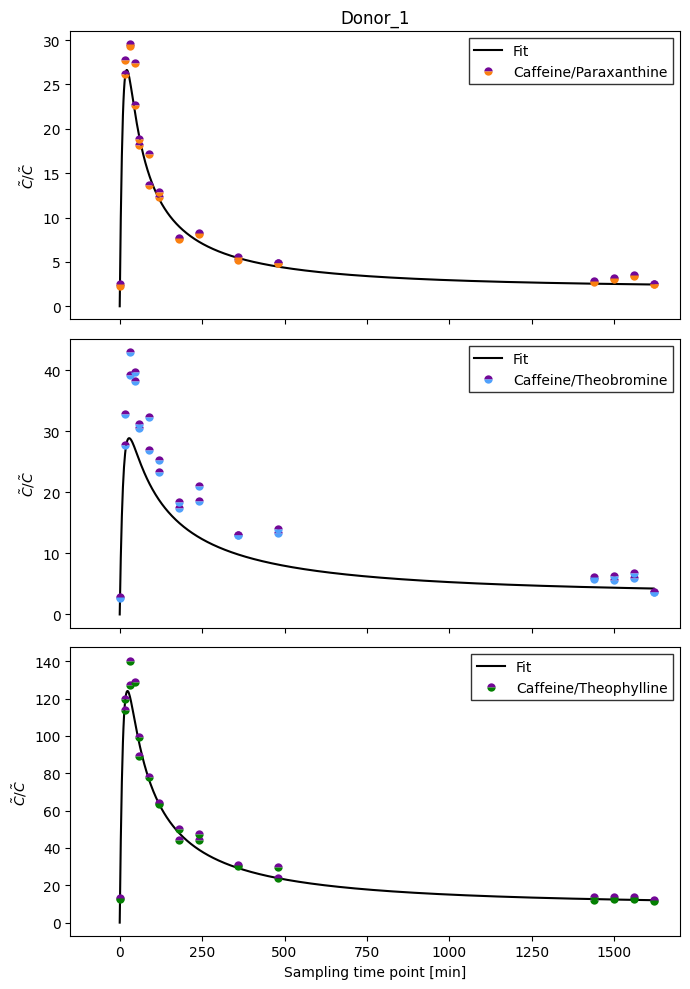

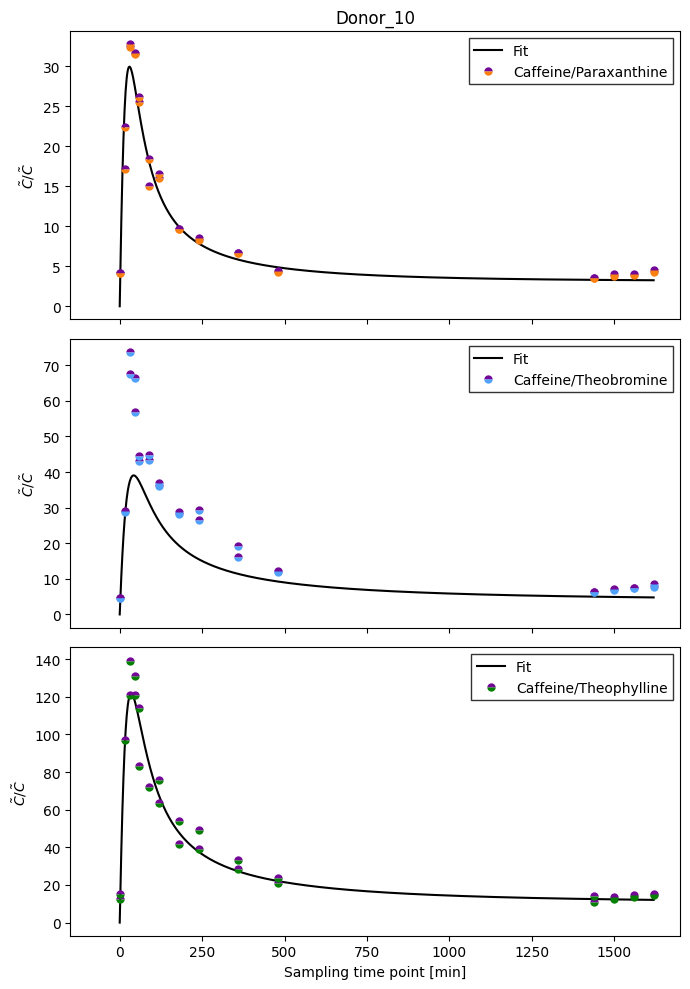

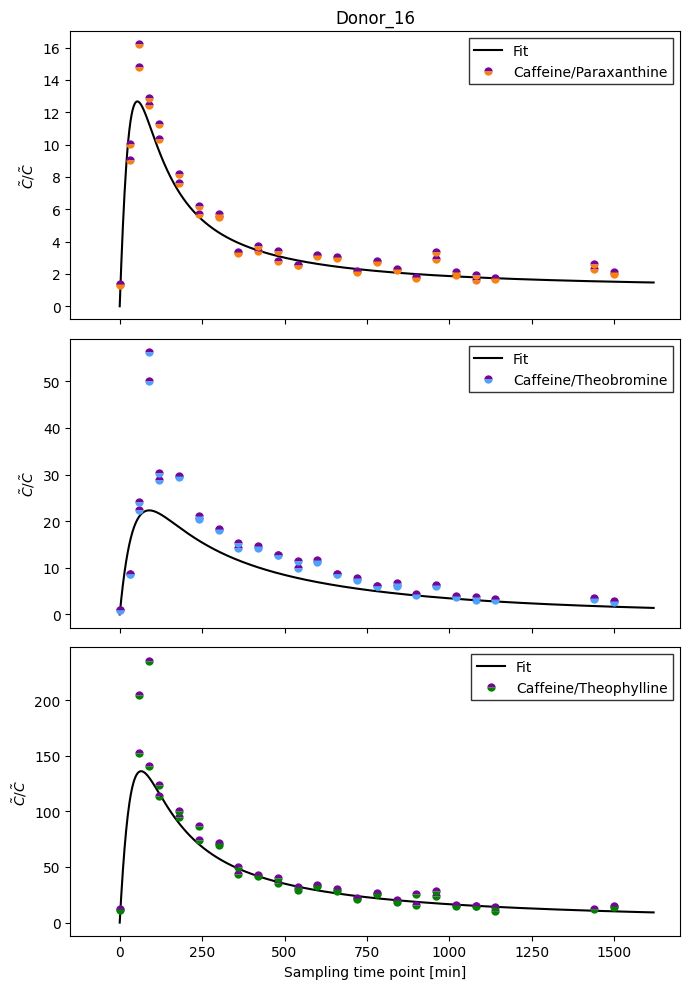

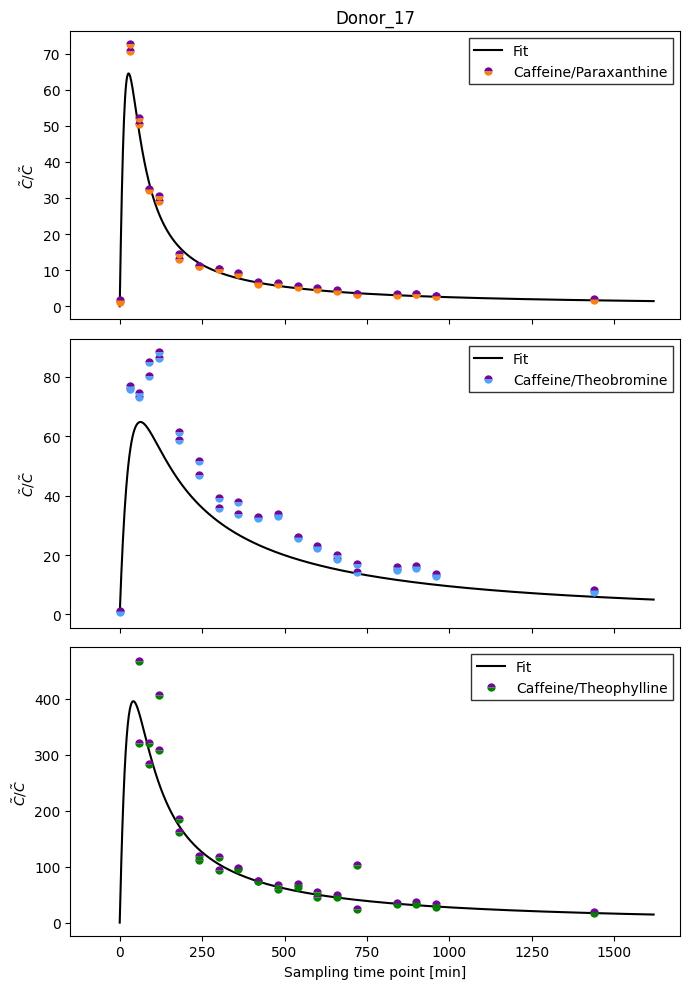

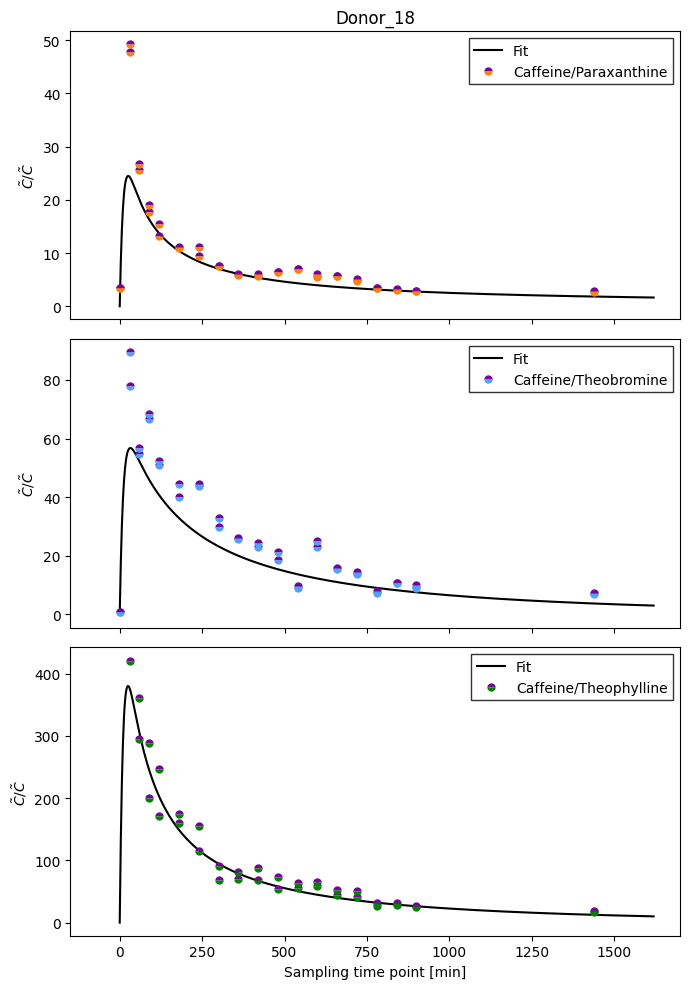

...

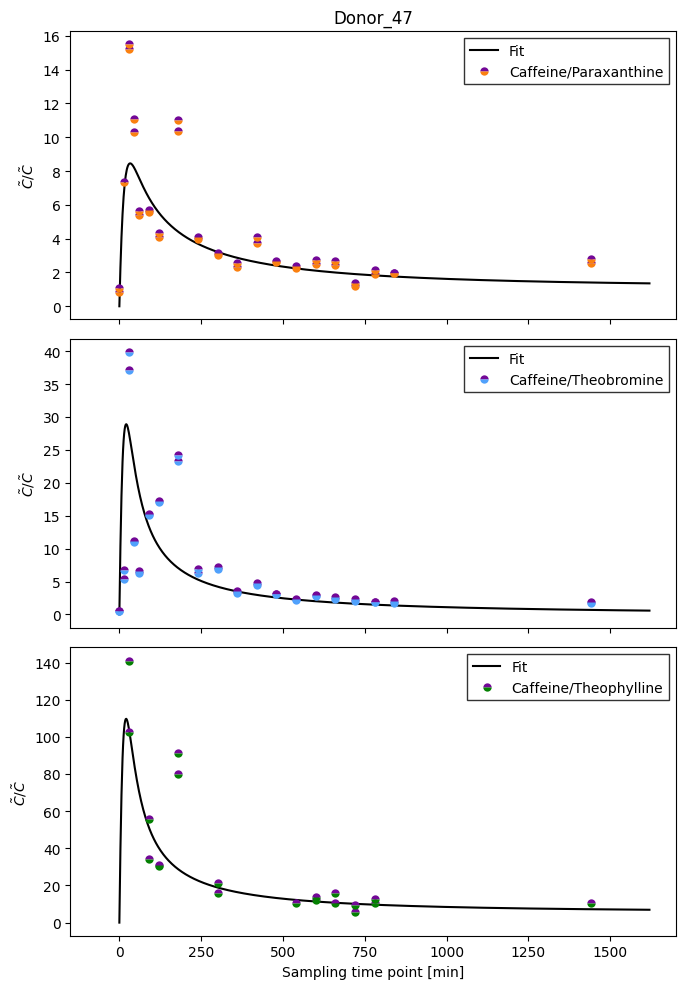

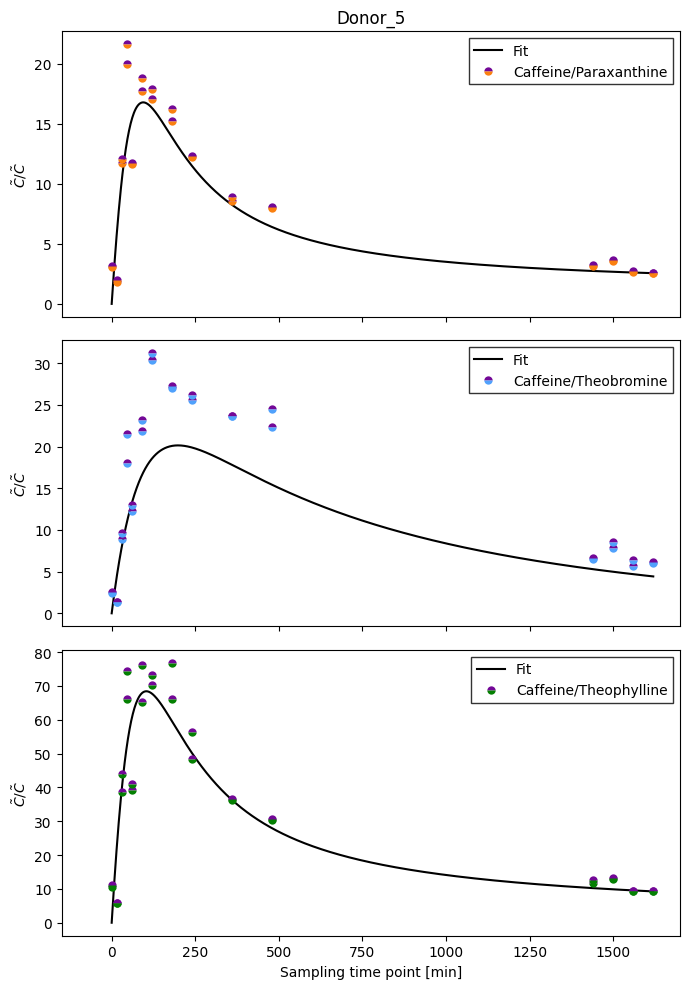

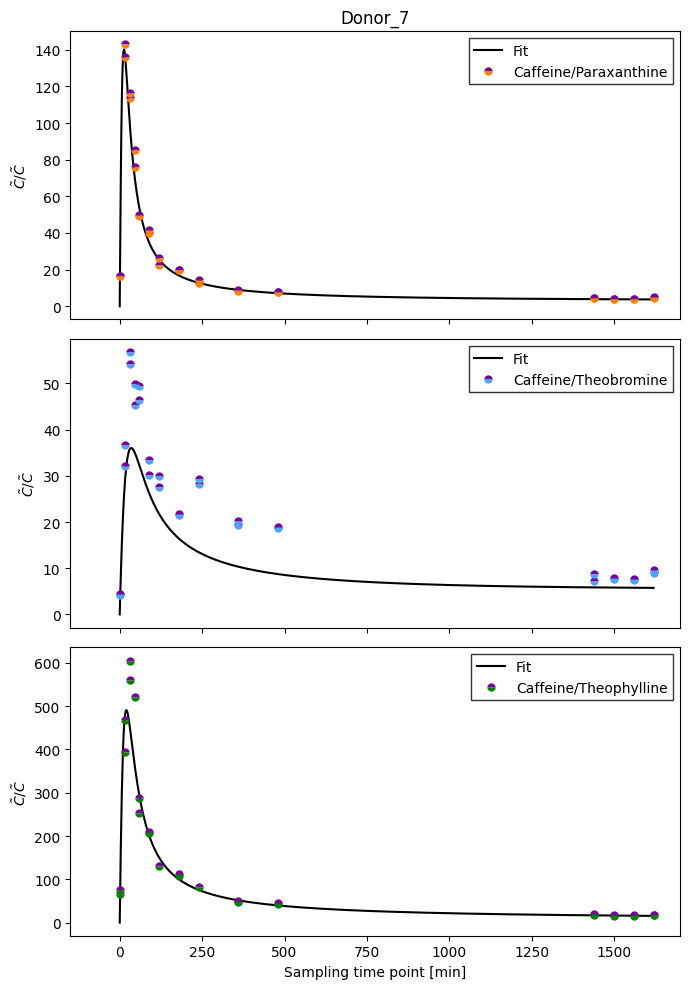

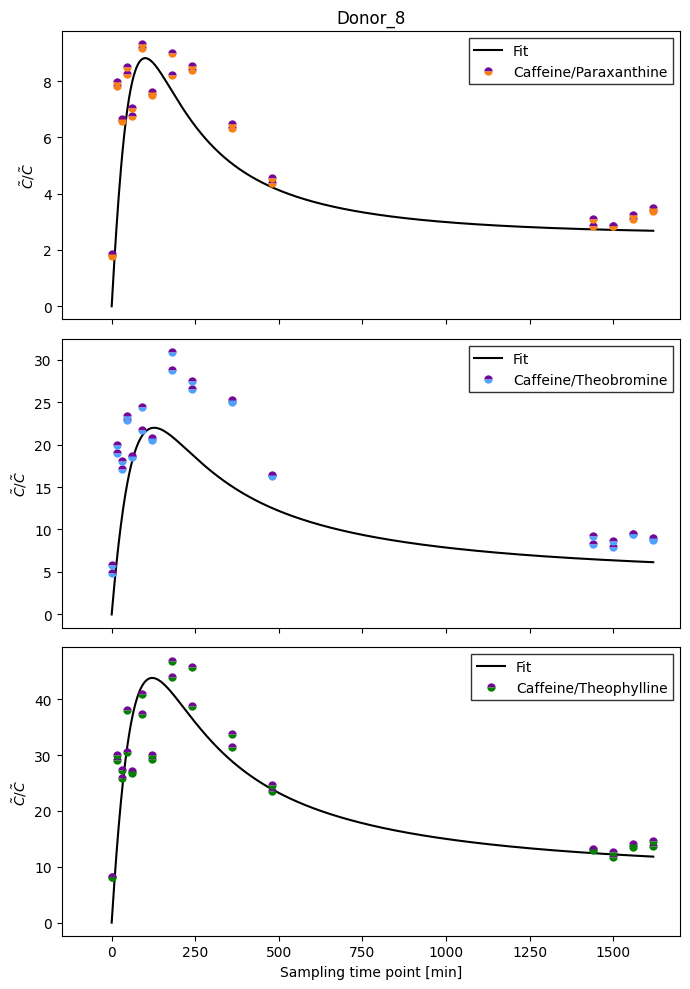

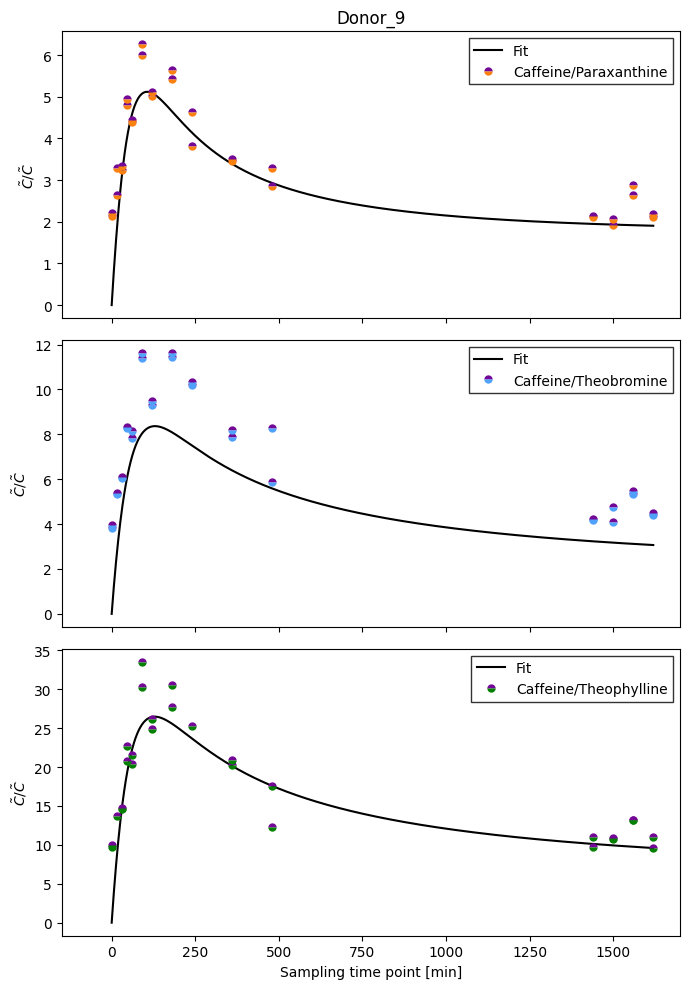

In [10]:
donors = ['Donor_1', 'Donor_10', 'Donor_16', 'Donor_17', 'Donor_18', 'Donor_19', 'Donor_2', 'Donor_20', 'Donor_21', 'Donor_22', 'Donor_23', 'Donor_24', 'Donor_25', 'Donor_26', 'Donor_27', 'Donor_28', 'Donor_29', 'Donor_3', 'Donor_30', 'Donor_31', 'Donor_32', 'Donor_33', 'Donor_34', 'Donor_35', 'Donor_36', 'Donor_37', 'Donor_38', 'Donor_39', 'Donor_4', 'Donor_40', 'Donor_41', 'Donor_42', 'Donor_43', 'Donor_44', 'Donor_45', 'Donor_46', 'Donor_47', 'Donor_5', 'Donor_7', 'Donor_8', 'Donor_9']

for donor in donors:
    data = load_data([donor])
    plot_relative_concentration(donor,data)

# plot V_sweat influence

In [11]:
def plot_sv_influence(donor,data):
    # define parameters
    args = best_parameters[donor][:11]
    sv   = np.array(best_parameters[donor][11:])
    sv2  = np.array([sv,sv]).flatten('F')
    
    fig = plt.figure(dpi=100,figsize=(10,10))
    ax1 = plt.subplot(2,2,1)
    ax2 = plt.subplot(2,2,2)
    ax3 = plt.subplot(2,2,3)
    ax4 = plt.subplot(2,2,4)
    ax1.set_yscale('log',base=10)
    ax2.set_yscale('log',base=10)
    ax3.set_yscale('log',base=10)
    ax4.set_yscale('log',base=10)

    x_values, y_values = get_fitted_concentration_data(data,donor,sv2)
    # pharmacological factors
    vdist_avail = 0.579                                        # volume of distribution/ bioavailability of caffeine
    dose        = 200*10**3                                    # caffeine dose in µg
    body_mass   = {'Donor_16': 72, 'Donor_6': 83, 'Donor_19': 83, 'Donor_17': 52, 'Donor_18': 66, 'Donor_7': 66, 'Donor_3': 57, 'Donor_4': 84, 'Donor_5': 82.5, 'Donor_2': 77, 'Donor_8': 80, 'Donor_9': 83, 'Donor_10': 55, 'Donor_11': 54, 'Donor_1': 70, 'Donor_20': 105, 'Donor_21': 70, 'Donor_22': 64, 'Donor_23': 57, 'Donor_24': 60, 'Donor_25': 80, 'Donor_26': 86, 'Donor_27': 68, 'Donor_28': 82, 'Donor_29': 60, 'Donor_30': 55, 'Donor_31': 80, 'Donor_32': 92, 'Donor_33': 92, 'Donor_34': 71, 'Donor_35': 80, 'Donor_36': 77, 'Donor_37': 66, 'Donor_38': 63, 'Donor_39': 75, 'Donor_40': 75, 'Donor_41': 57, 'Donor_42': 75, 'Donor_43': 99, 'Donor_44': 75, 'Donor_45': 61, 'Donor_46': 52, 'Donor_47': 80}
    factor      = dose/(body_mass[donor]*vdist_avail)/1000          # to get to mg/L
    
    func_list  = [caf,par,bro,phy]
    color_list = ['730897','fa8010','50a1fc','048002']
    name_list  = ['Caffeine','Paraxanthine','Theobromine','Theophylline']
    ax_list    = [ax1,ax2,ax3,ax4]
    
    for func, color, name, ax, idx in zip(func_list,color_list,name_list,ax_list,[0,1,2,3]):
        ax.plot(np.linspace(0,27,1000)*60,func(np.linspace(0,27,1000),*args)*factor,color=f'#{color}',label=r'{}'.format('$C_{'+name+'}$'))
        tp = data[donor]['time'][::2]*60
        dat = y_values[idx::4]
        avdat = np.mean([dat[1::2],dat[0::2]],axis=0)
        ax.plot(tp,avdat*sv,'.',color=f'#{color}',label=r'{}'.format('$\\tilde{C}_{'+name+'}$'))
        bar_bottom = avdat*sv
        bar_top    = avdat
        bar_size   = bar_top-bar_bottom
        ax.bar(tp[np.isnan(bar_size) == False],bar_size[np.isnan(bar_size) == False],bottom=bar_bottom[np.isnan(bar_size) == False],color='k',width=10,alpha=1)
        ax.plot(0,0,'k-',label=r'$SV$')
        ax.set_title(donor+' '+name)

    ax4.set_xlabel('Sampling time point in min')
    ax3.set_xlabel('Sampling time point in min')
    ax1.set_ylabel('Concentration in µg/mL')        
    ax3.set_ylabel('Concentration in µg/mL')        
    fig.tight_layout()
    plt.show()
    return bar_size, bar_bottom, tp

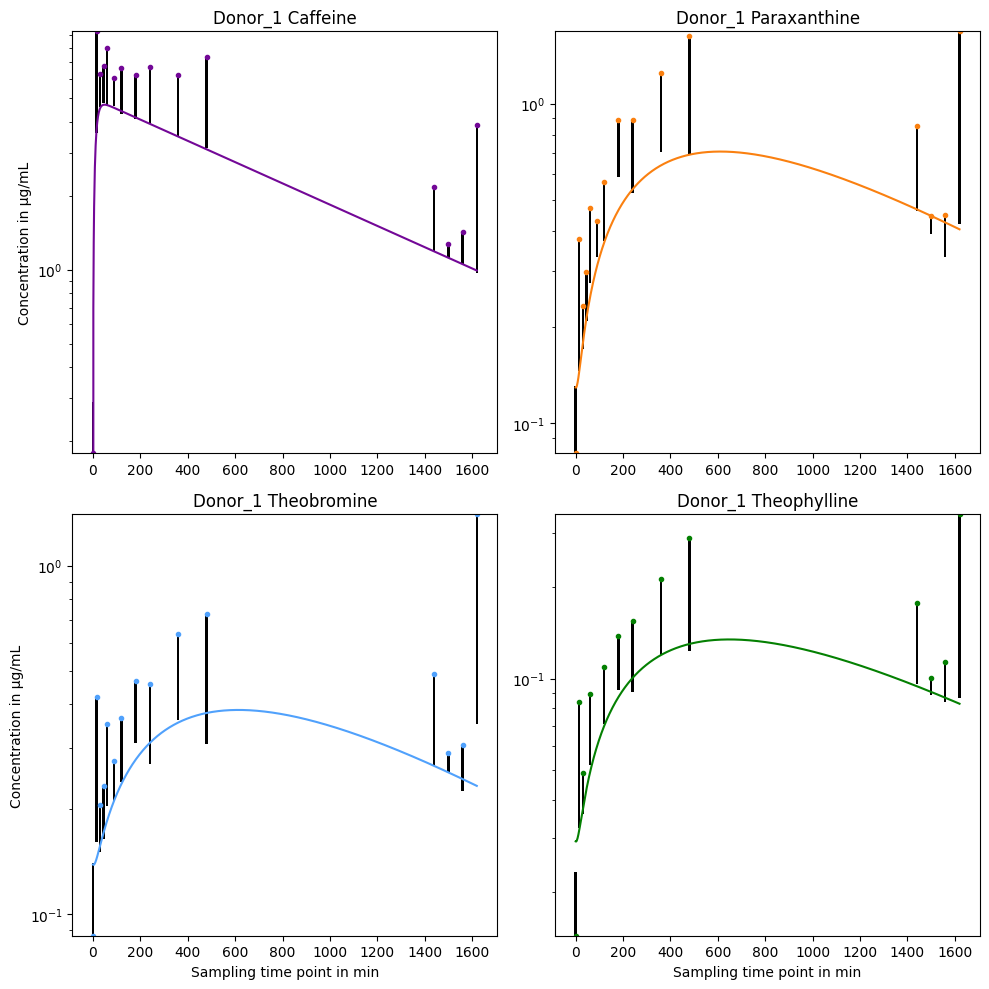

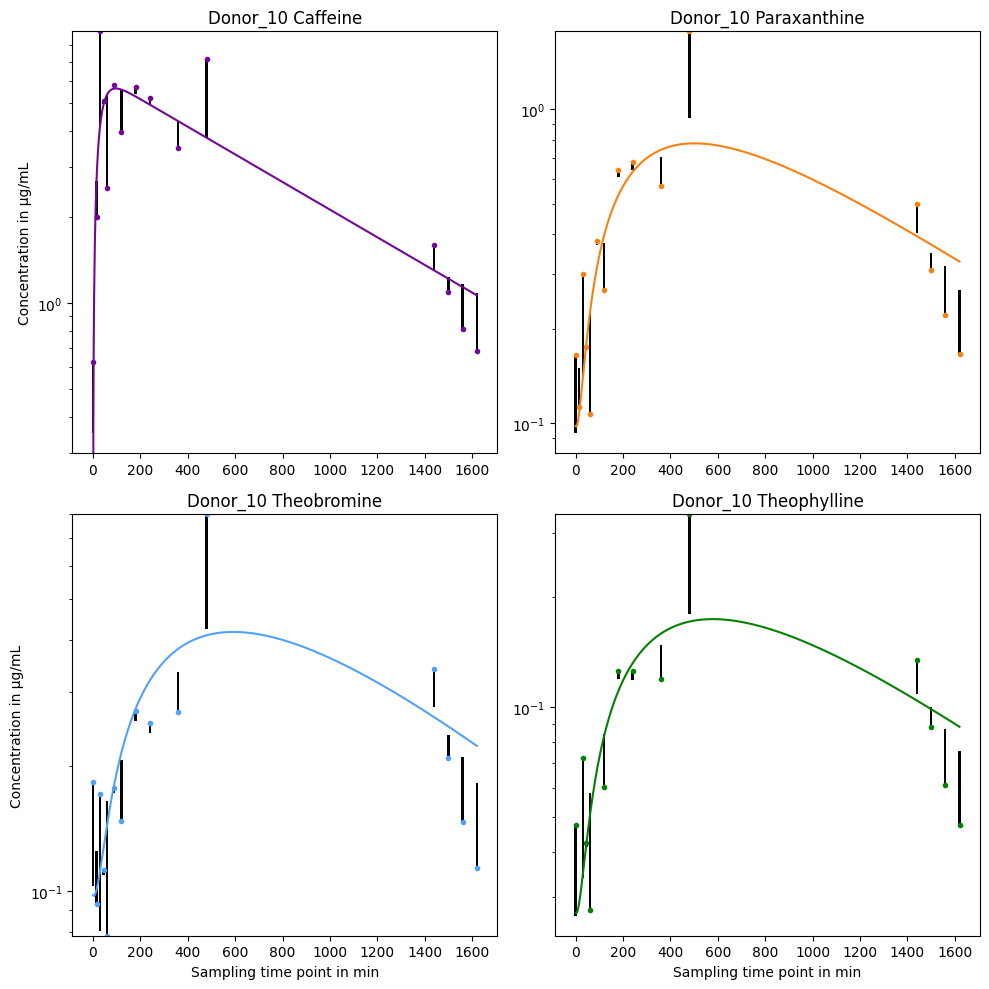

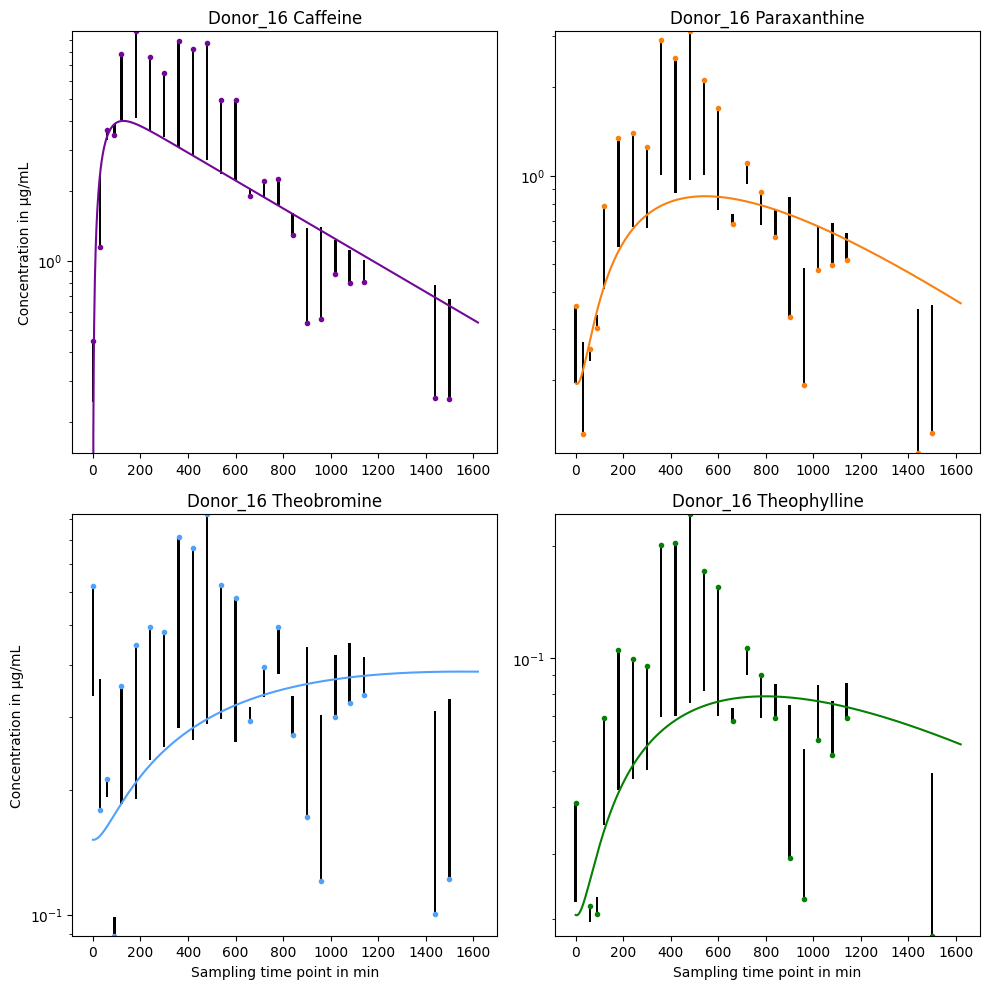

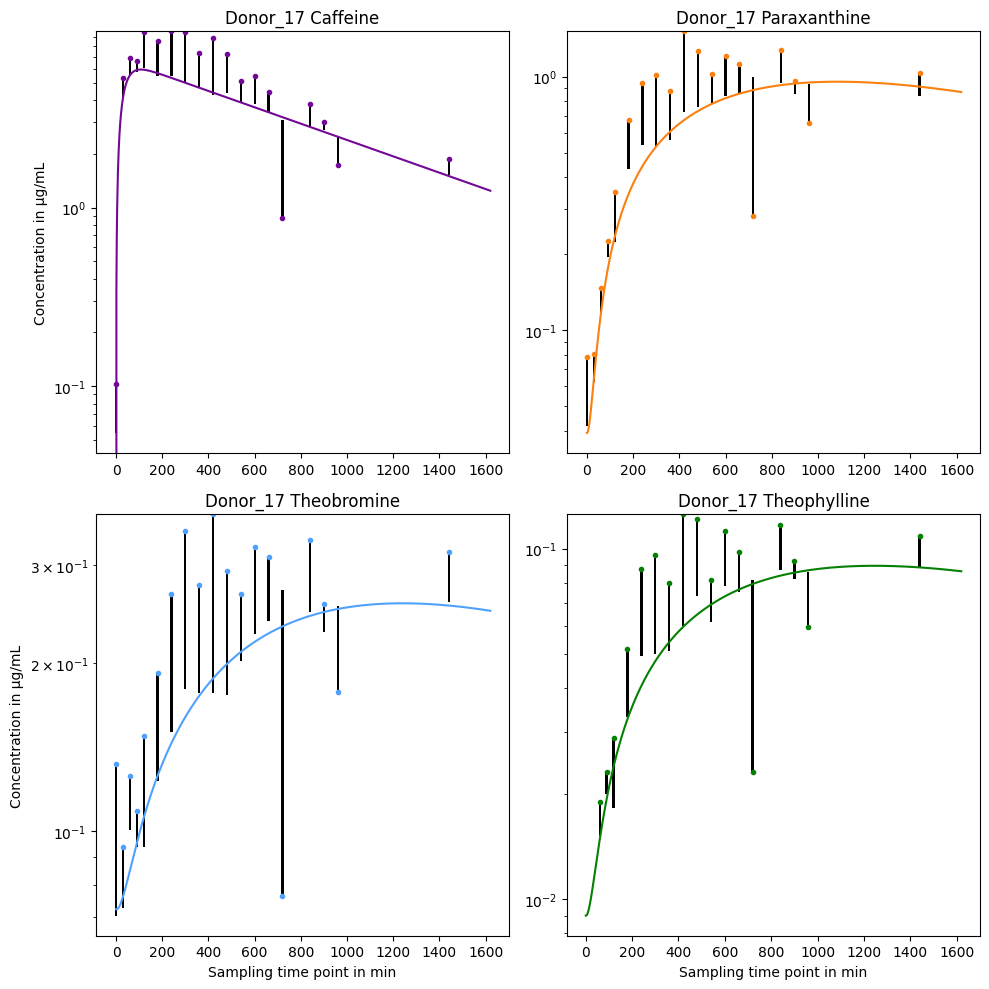

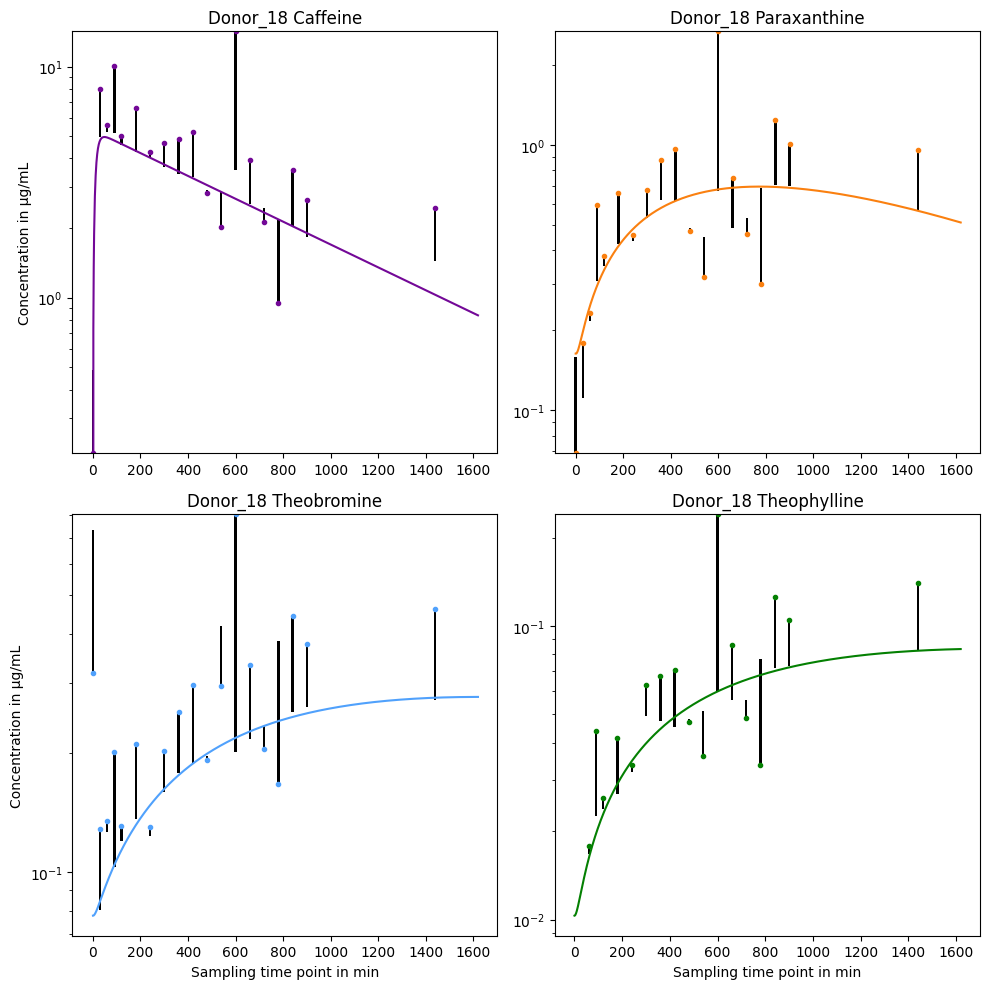

...

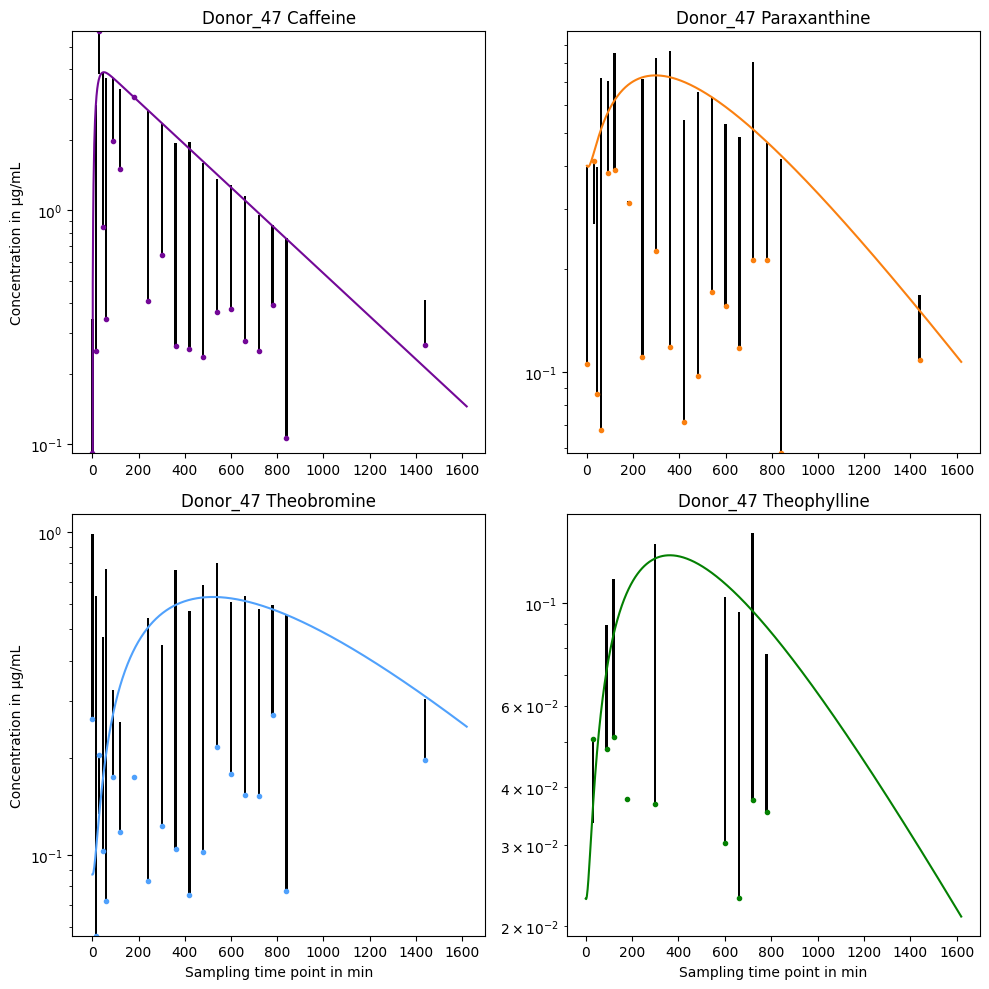

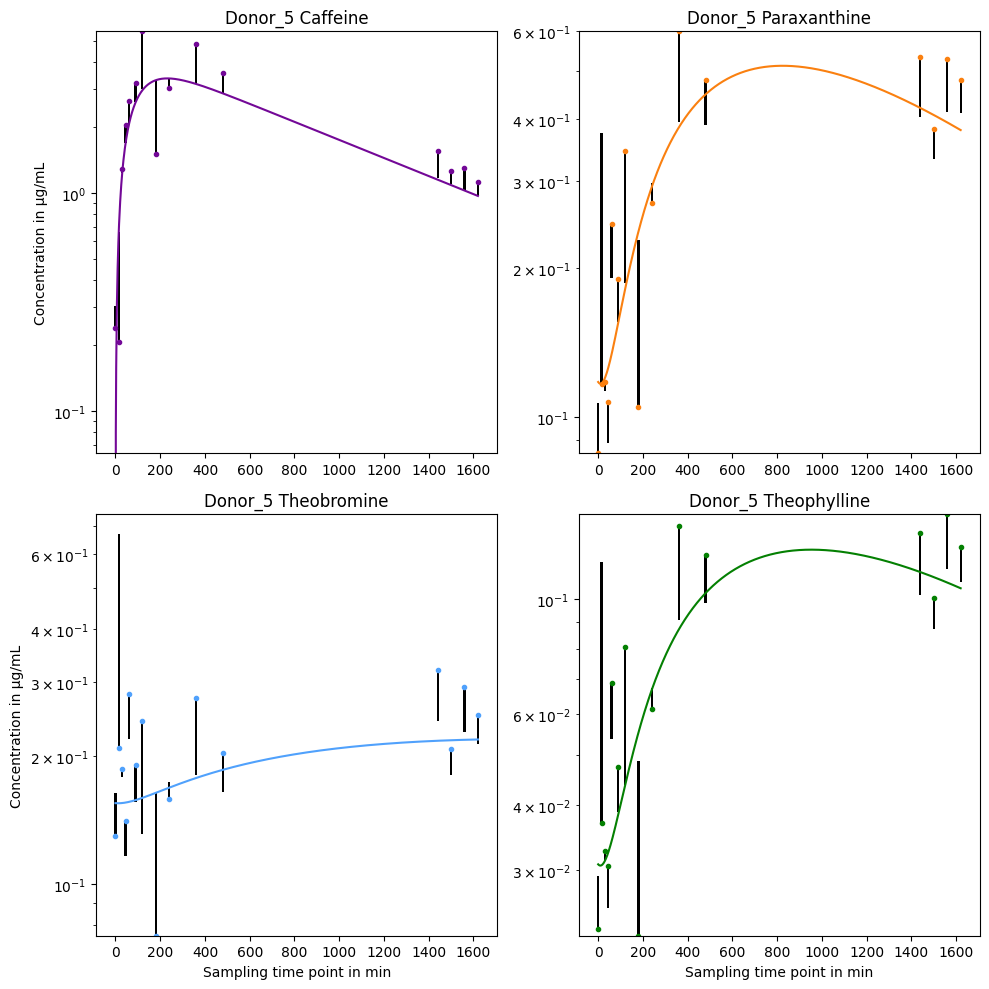

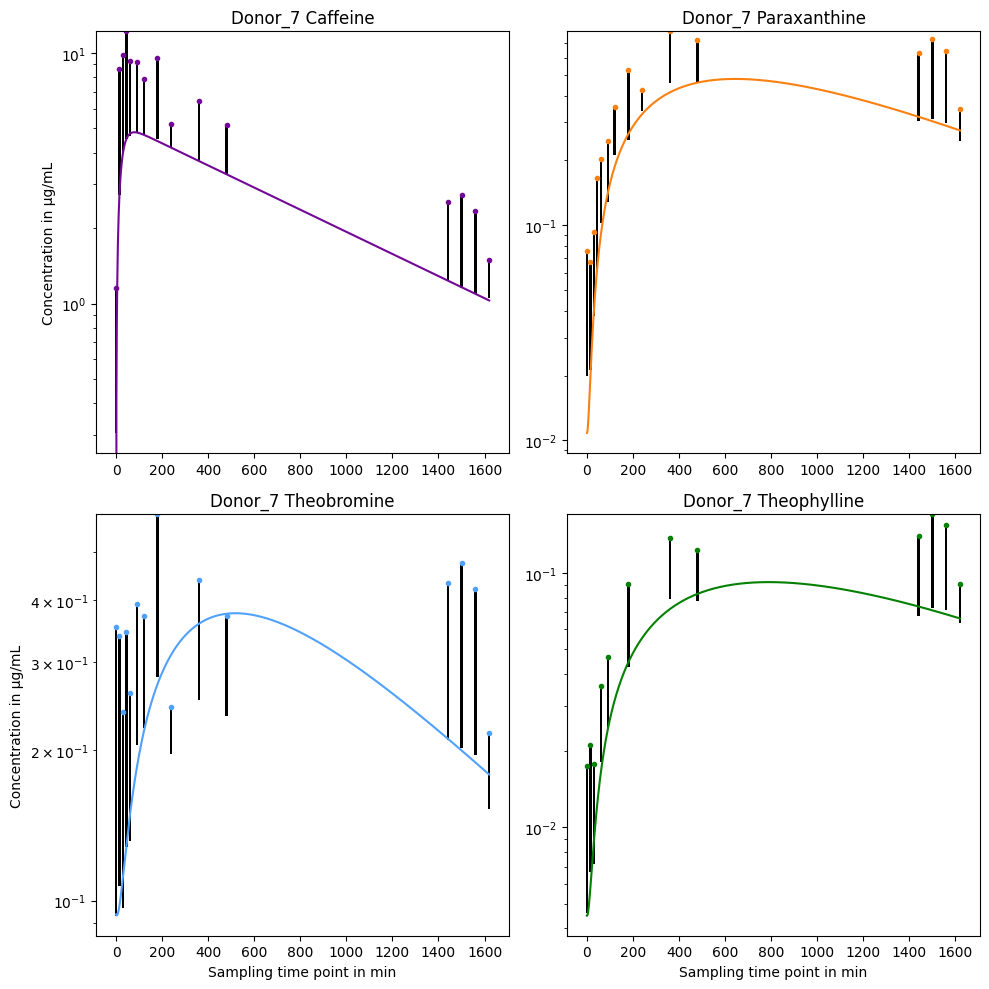

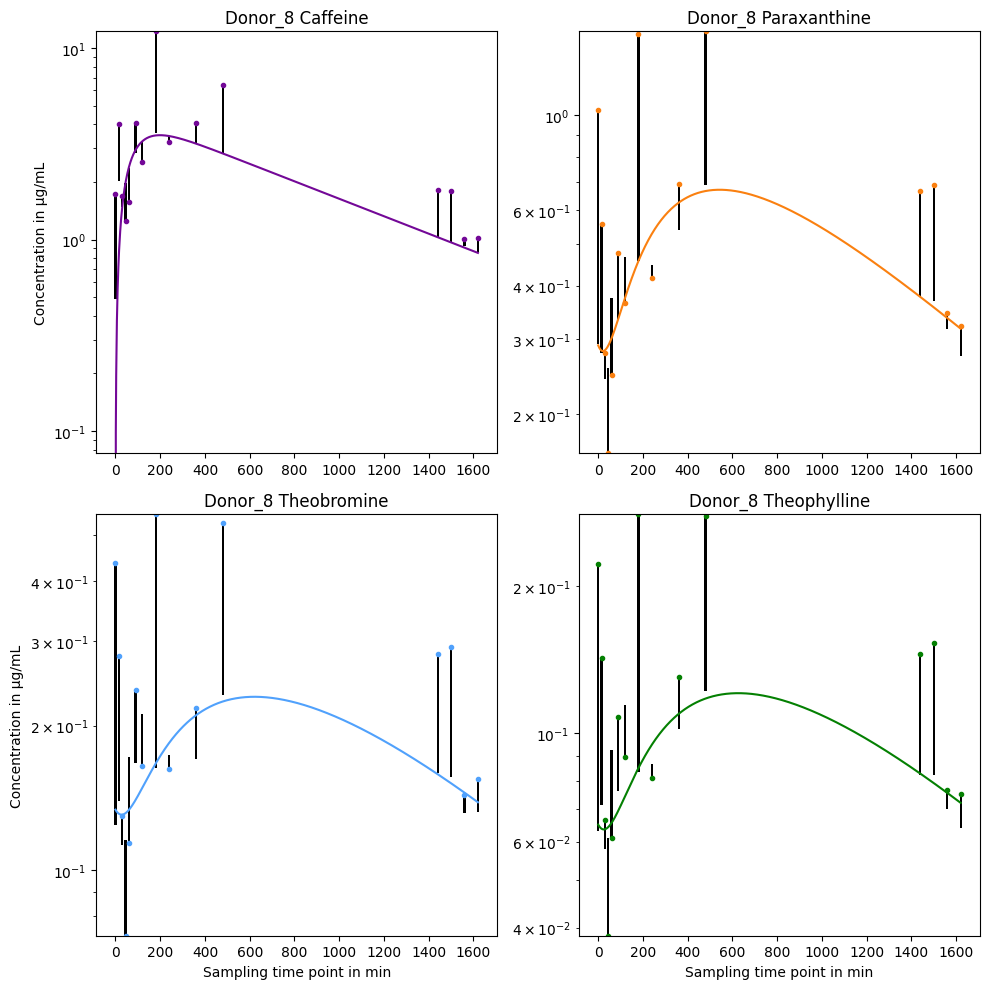

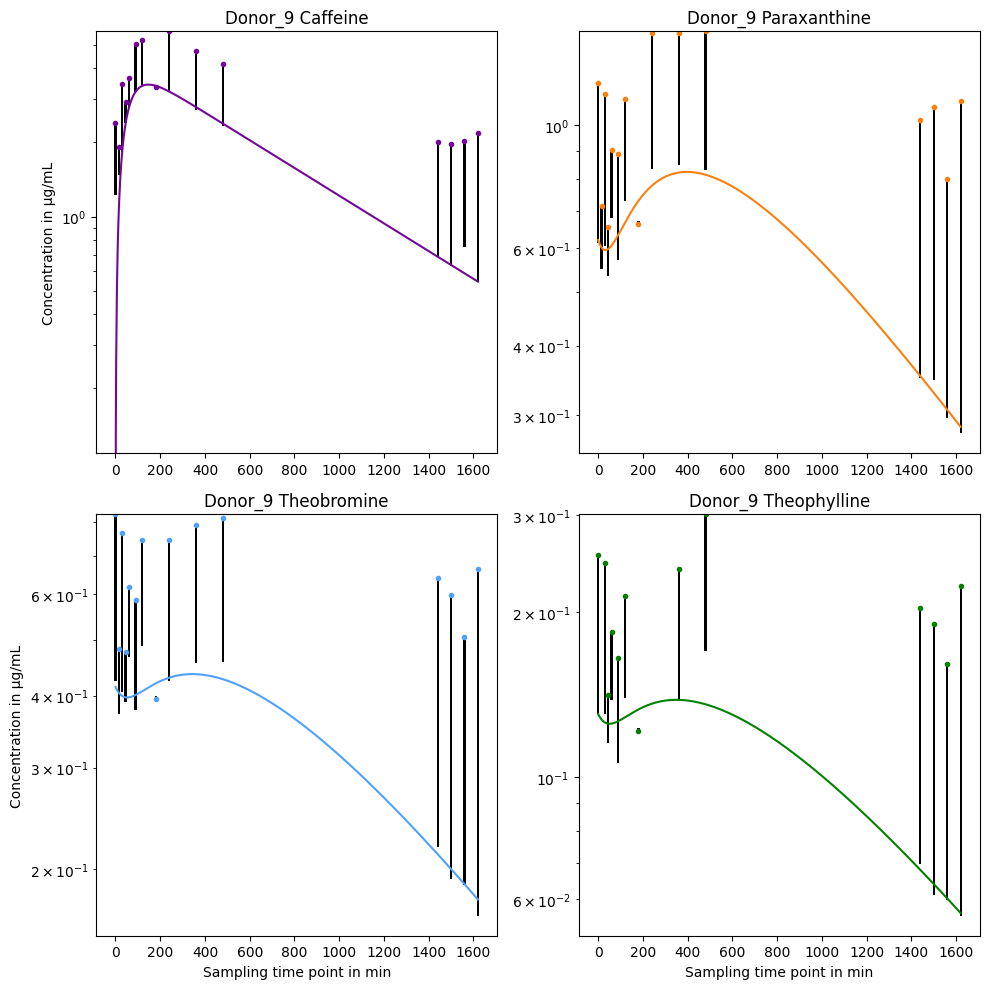

In [12]:
donors = ['Donor_1', 'Donor_10', 'Donor_16', 'Donor_17', 'Donor_18', 'Donor_19', 'Donor_2', 'Donor_20', 'Donor_21', 'Donor_22', 'Donor_23', 'Donor_24', 'Donor_25', 'Donor_26', 'Donor_27', 'Donor_28', 'Donor_29', 'Donor_3', 'Donor_30', 'Donor_31', 'Donor_32', 'Donor_33', 'Donor_34', 'Donor_35', 'Donor_36', 'Donor_37', 'Donor_38', 'Donor_39', 'Donor_4', 'Donor_40', 'Donor_41', 'Donor_42', 'Donor_43', 'Donor_44', 'Donor_45', 'Donor_46', 'Donor_47', 'Donor_5', 'Donor_7', 'Donor_8', 'Donor_9']

for donor in donors:
    data = load_data([donor])
    bla = plot_sv_influence(donor,data)

# plot PCA

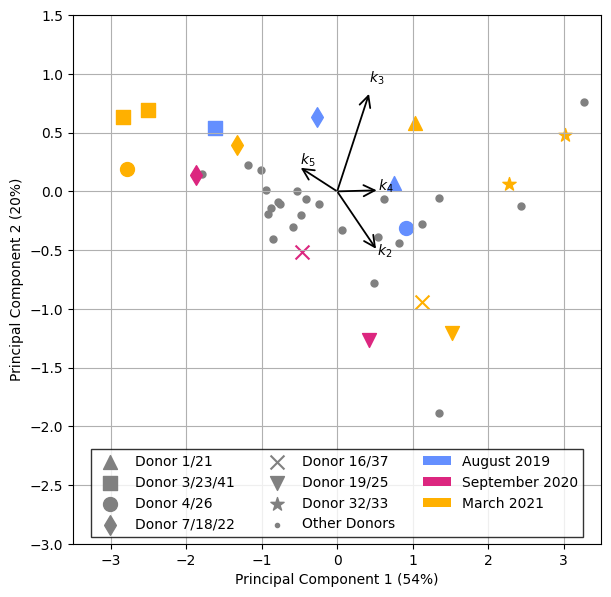

In [13]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import matplotlib.patches as mpatches

donors = ['Donor_1', 'Donor_10', 'Donor_16', 'Donor_17', 'Donor_18', 'Donor_19', 'Donor_2', 'Donor_20', 'Donor_21', 'Donor_22', 'Donor_23', 'Donor_24', 'Donor_25', 'Donor_26', 'Donor_27', 'Donor_28', 'Donor_29', 'Donor_3', 'Donor_30', 'Donor_31', 'Donor_32', 'Donor_33', 'Donor_34', 'Donor_35', 'Donor_36', 'Donor_37', 'Donor_38', 'Donor_39', 'Donor_4', 'Donor_40', 'Donor_41', 'Donor_42', 'Donor_43', 'Donor_44', 'Donor_45', 'Donor_46', 'Donor_47', 'Donor_5', 'Donor_7', 'Donor_8', 'Donor_9']

kinetics = {}
for donor in donors:
    kinetics[donor] = best_parameters[donor][1:5]
    
kinetics_df = pd.DataFrame(kinetics,index=['k2','k3','k4','k5']).transpose()

# PCA
features = kinetics_df.columns
x_values = kinetics_df.values
y_values = kinetics_df.index
x_scaled = StandardScaler().fit_transform(x_values)
pca    = PCA(n_components=2)
pcs    = pca.fit_transform(x_scaled)
pca_df = pd.concat([kinetics_df,pd.DataFrame(data = pcs, columns = ['PC1', 'PC2'],index=y_values)], axis = 1)

plt.figure(dpi=100,figsize=(7,7))
ax = plt.subplot(111,box_aspect=1)
for donor in pca_df.index:
    if float(donor.split('_')[1]) < 14:
        color = '#648FFF'
    elif float(donor.split('_')[1]) < 20:
        color = '#DC267F'
    else:
        color = '#FFB000'
    
    if donor in ['Donor_1','Donor_21']:
        marker = '^'
    elif donor in ['Donor_3','Donor_23','Donor_41']:
        marker = 's'
    elif donor in ['Donor_4','Donor_26']:
        marker = 'o'
    elif donor in ['Donor_7','Donor_18','Donor_22']:
        marker = 'd'
    elif donor in ['Donor_16','Donor_37']:
        marker = 'x'
    elif donor in ['Donor_19','Donor_25']:
        marker = 'v'
    elif donor in ['Donor_32','Donor_33']:
        marker = '*'
    else:
        marker='.'
        color = 'grey'
    plt.scatter(pca_df.loc[donor,'PC1'],pca_df.loc[donor,'PC2'],marker=marker,color=color, s=100)
plt.xlim(-3.5,3.5)
plt.ylim(-3,1.5)
plt.grid(zorder=0)
plt.bar(0,0,color='#648FFF',label='August 2019')
plt.bar(0,0,color='#DC267F',label='September 2020')
plt.bar(0,0,color='#FFB000',label='March 2021')

plt.scatter(-10,-10,marker="^",label="Donor 1/21",color="gray",s=100)
plt.scatter(-10,-10,marker="s",label="Donor 3/23/41",color="gray",s=100)
plt.scatter(-10,-10,marker="o",label="Donor 4/26",color="gray",s=100)
plt.scatter(-10,-10,marker="d",label="Donor 7/18/22",color="gray",s=100)
plt.scatter(-10,-10,marker="x",label="Donor 16/37",color="gray",s=100)
plt.scatter(-10,-10,marker="v",label="Donor 19/25",color="gray",s=100)
plt.scatter(-10,-10,marker="*",label="Donor 32/33",color="gray",s=100)
plt.scatter(-10,-10,marker=".",label="Other Donors",color="gray")
plt.legend(loc='lower center',fancybox=False,edgecolor='k',ncol = 3)
plt.xlabel('Principal Component 1 ({:.0f}%)'.format(pca.explained_variance_ratio_[0]*100))
plt.ylabel('Principal Component 2 ({:.0f}%)'.format(pca.explained_variance_ratio_[1]*100))

for nr,idx in enumerate([r'$k_2$',r'$k_3$',r'$k_4$',r'$k_5$']):
    scale = 1
    zero_cords = (0,0)
    pointers = (zero_cords[0]+pca.components_[0,nr]*scale,zero_cords[1]+pca.components_[1,nr]*scale)
    arrow = mpatches.FancyArrowPatch(zero_cords, pointers,arrowstyle='->',mutation_scale=20,shrinkA=1,shrinkB=1,linewidth=1.3,zorder=10)
    ax.text(zero_cords[0]+pca.components_[0,nr]*scale*1,zero_cords[1]+pca.components_[1,nr]*scale*1.1,idx)
    ax.add_patch(arrow)
        
plt.show()